# Kennlinie & Empfindlichkeit
<a id="Sec-Kennlinie"></a>

Jede einzelne der Komponenten führt die an ihr anliegenden Eingangssignal in Ausgangssignale über. Wie diese Überführung genau aussieht beschreibt die sogenannte **Kennlinie**, die für jede Komponente unterschiedlich aussehen kann. In {numref}`ideale_kennlinie` ist beispielhaft eine lineare, ideale Kennlinie dargestellt. 

:::{figure-md} ideale_kennlinie
<img src="draw/ideale_kennlinie.jpg" alt="ideale_kennlinie" class="bg-primary mb-1" width="400px" label = ideale_kennlinie>

Ideale Messkennlinie.
:::

## Statische Kenngrößen
<a id="SubSec-Statische_Kenngrößen"></a>

Für jede Eingangsgröße $u$ wird anhand der Kennlinie eine Ausgangsgröße $y$ definiert. Beispielsweise wird anhand der Kennlinie eines Temperatursensors ein bestimmter Temperaturwert in eine Spannung umgewandelt. 

* Der Bereich, indem der Sensor beispielsweise noch korrekt arbeitet (meist vom Hersteller garantiert) wird **Messbereich (engl. range)** genannt und wird durch den minimal und maximal möglichen Wert, der noch als Eingang angelegt werden kann oder darf, angegeben. Im Falle eines Temperatursensors wäre ein typischer Messbereich z.B. -40°C bis 120°C. 
* Die Differenz zwischen diesen Maximal- und Minimalwert nennt man **Spanne (engl. span)** (bezogen auf unser Beispiel also 160°C). 
* Die Spanne ist mit einem Bereich auf der y-Achse korreliert, nämlich dem sogenannten **Vollbereichssignal (engl. full scale output = FSO)**.
* Der **Übertragungsfaktor $k$** oder auch oft *Verstärkung* genannt beschreibt die Überführung des Eingangssignals der Messeinrichtung, also der Messgröße, in ein Ausgangssignal:

$$y = k \cdot u$$

* Die **Statische Kennlinie** ist im Prinzip der *Übertragungsfaktor*, aber dieses Mal definiert für alle möglichen Eingangssignale.

$$y(u) = k \cdot u$$

## Empfindlichkeit

Die Kennlinie sollte immer eine gewisse Steigung aufweisen. Oder man könnte auch sagen, dass wenn sich die Eingangsgröße $u$ ändert, dass dies auch immer eine Änderung in der Ausgangsgröße $y$ mit sich ziehen sollte. Im Falle einer Verstärkungseinheit könnte diese Änderung sogar vergrößert werden und das System reagiert somit *empfindlicher* auf Änderungen der Eingangsgröße. Mathematisch betrachtet bedeutet die Steilheit nichts anderes als die Steigung bzw. die Ableitung der Ausgangsgröße $y(u)$ an einer bestimmten Stelle $u$:

$$S(u) = \frac{\partial y(u)}{\partial u} = \frac{\partial f(u)}{\partial u}$$

Dies wird auch die Empfindlichkeit $S(u)$ genannt und entspricht der Tangente im Punkt $u$.
Bei einer Messeinrichtung mit linearer Kennlinie sind die Empfindlichkeit $S$ und die Übertragungsfunktion $k$ demzufolge identisch. 

## Kennlinienbeispiele
<a id="SubSec-Beispiel"></a>

### Widerstandsthermometer

Reine Metalle sind **Kaltleiter**. Platin hat beispielsweise einen Widerstandswert von R0 = R(0) = 100 Ohm bei 0 °C, daher der Name PT100. Sie können bei geeigneter Ausrüstung bis 850 °C eingesetzt werden. Sie haben eine fast lineare Kennlinie bei einer relativen Widerstandsänderung von knapp 0,4 % pro °C:

$$R(T) = R_0 \cdot (1 + AT + BT^2)$$

Folgende Parameter gelten für bestimmte Temperaturbereiche:
* 0-850°C: A= 3,9e-3/°C, B=-5,7e-7/°C$^2$
* -200-0°C: C = -4,2e-1/°C$^4$

Thermistoren mit negativen Temperaturkoeffizienten (NTC = Negative thermal coefficient , Heißleiter) weisen aufgrund des zugrundeliegenden Halbleiter-Effektes eine hohe Abhängigkeit von Fehlstellen, wie der Dotierung der Grundstoffe auf. 
**Heißleiter** sind bis etwa 150 °C einsetzbar. 
Sie weisen gegenüber Platin-Messwiderständen eine deutlich höhere Empfindlichkeit auf:

$$ R(T)=R_{25} \cdot \mathrm e^{B\left(\frac{1}{T+273}-\frac{1}{298}\right)}$$

mit R25 = 1000 Ohm und B = 3528.

Ein Transition Edge Sensor (TES), bzw. auf deutsch Phasenübergangsthermometer, ist ein supraleitender Temperatursensor, der in der Lage ist, kleinste Temperaturänderungen im Bereich von wenigen 100 $\mu\mathrm K$ zu messen. Seine Umgebungstemperatur wird je nach Material auf wenige mK runtergekühlt, um das Material in einen supraleitenden Zustand (d.h. sein Widerstand verschwindet) zu bringen. Dies ist die sogenannte kritische Temperatur, $T_c$, aber der Materiale supraleitende Eigenschaften aufweisen. Der Widerstand wird über Anlegen einer Stromstärke minimal aufgeheizt, sodass sein Arbeitspunkt in den Übergang (die steile Flanke) geschoben wird. An diesem Punkt ist die Ableitung, und somit die Empfindlichkeit, maximal. 

$$ R(T)= \frac{a}{1 + \mathrm e^{-k(T-T_c)}} $$

mit z.B. $k$ = 1.86/mK, $a$ = 0.224 Ohm und $T_c$ = 103.2 mK

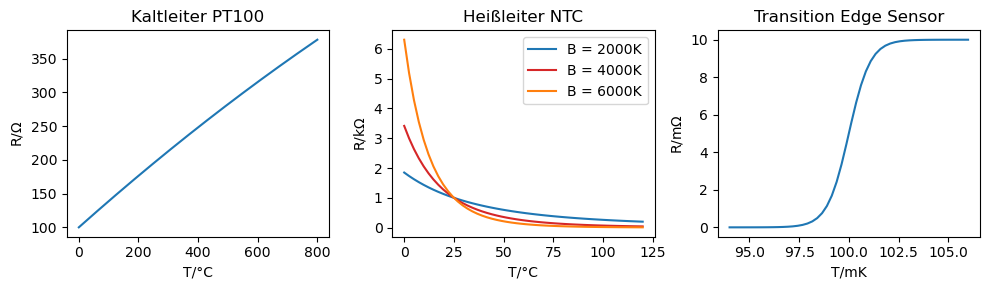

In [1]:
#Benötigte Libraries:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import seaborn as sns
import time
import warnings
warnings.filterwarnings('ignore')

# MatplotLib Settings:
plt.style.use('default') # Matplotlib Style wählen
#plt.xkcd()
plt.rcParams['font.size'] = 10; # Schriftgröße

#--------- Kaltleiter PT100 -------------
T_PT = np.linspace(0, 800, num=800)
def R_PT(T_PT):
    R_0 = 100 # in Ohm
    A = 3.93e-3 # in 1/°C
    B = -5.7e-7 # in 1/^C^2
    return R_0 * (1 + A*T_PT + B * T_PT**2)

#--------- Heißleiter NTC -------------
T_NTC = np.linspace(0+273.15, 120+273.15, num=50)
def R_NTC(T_NTC, B):
    R_25 = 1000 # in Ohm
    T_25 = 25.0 + 273.15 # in Kelvin
    return R_25 * np.exp(B * (1/(T_NTC) - 1/T_25))

#--------- Transition Edge Sensor -------------
T = np.linspace(94, 106, num=50)
def R(T):
    k = 1.86 # in 1/mK
    a = 0.01 # in Ohm
    Tk = 100 # in mK
    return a / (1+ np.exp(-k * (T-Tk)))


#--------- Diagramme -------------
f, axs = plt.subplots(1,3,figsize=(10,3))

axs[0].plot(T_PT,R_PT(T_PT), color = 'tab:blue')
axs[0].set_xlabel('T/°C')
axs[0].set_ylabel(r'R/$\Omega$')
axs[0].set_title('Kaltleiter PT100')

axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 2000)/1000, label = "B = 2000K", color = 'tab:blue')
axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 4000)/1000, label = "B = 4000K", color = 'tab:red')
axs[1].plot(T_NTC-273.15,R_NTC(T_NTC, 6000)/1000, label = "B = 6000K", color = 'tab:orange')
axs[1].set_xlabel('T/°C')
axs[1].set_ylabel(r'R/k$\Omega$')
axs[1].set_title('Heißleiter NTC')
axs[1].legend()

axs[2].plot(T,R(T)*1000, color = 'tab:blue')
axs[2].set_xlabel('T/mK')
axs[2].set_ylabel(r'R/m$\Omega$')
axs[2].set_title('Transition Edge Sensor')

plt.tight_layout()
plt.show()

### Laserinterferometer


::::::{margin}
:::::{grid}
::::{grid-item-card}
:class-header: bg-light
Michelson - Interferometer, Aufbau und Messung | Physik - Experimente & Formeln - Matthias Kohl

<iframe width="200" height="113" src="https://www.youtube.com/embed/8YgVQHbHR0I?si=ZIJ-BZS3DI2d9IfK" title="YouTube video player" frameborder="0" allow="accelerometer; autoplay; clipboard-write; encrypted-media; gyroscope; picture-in-picture; web-share" allowfullscreen></iframe>
::::
:::::
::::::

```{seealso}
Wie funktioniert [Laserinterferometerie](6_Ifo.ipynb)?
```

Laserinterferometer sind extrem empfindliche Messinstrumente und in modernen Messaufbauten fast immer vorhanden, wenn Längenänderungen, Geschwindikeiten oder Beschleunigungen gemessen werden soll. 

:::{figure-md} ifo1
<img src="draw/ifo1.png" alt="ifo1"  width="300px" label = ifo1>

Laserinterferometer.
:::

In einem Interferometer werden Längen durch die Messung von Phasenverschiebungen von zwei interferierenden elektromagnetischen Wellen (Laser) bestimmt. Die Phasenverschiebung ist direkt mit der Weglängendifferenz zwischen den beiden Wellen verbunden 

$$ 2 \cdot \Delta L = \left( \frac{\Delta \phi}{2\pi} \right) \cdot \lambda $$

- $\Delta L$ ist die Weglängendifferenz,
- $ \Delta \phi$ ist die Phasenverschiebung in Radiant,
- $ \lambda $ ist die Wellenlänge des Lichts.

Der Faktor 2 resultiert daraus, dass in Interferometern der Laserstrahl reflektiert wird und somit die Weglängendifferenz 2x durchläuft. Dies erhöht die **Auflösung** der Messung um den Faktor 2. 
Wenn wir die Phasenverschiebung und die Wellenlänge kennen, können wir die Weglängendifferenz berechnen, die einer Längenänderung entspricht. 
Die Wellenlänge ist für Laser extrem genau bekannt. Wie erhält man jedoch die Phaseninformation? Bei der Interferenz (Überlagerung) von den beiden Laserstrahlen am Strahlteiler entsteht ein Interferenzmuster. Eine Fotodiode ist in der Lage, die *Intensität* der Laserstrahlen zu messen, welche proportional zu Quadrat der beiden Laserwellen $E_1$ und $E_2$ ist:

$$I(x,t) = |E_1 + E_2|^2 = ... = E_0^2 \cdot (1 + \cos(\Delta \phi))$$


```{admonition} Herleitung der interferometerischen Intensität
:class: dropdown

Die elektrischen Felder der beiden Wellen entlang der beiden Interferometerarme sind gegeben durch:

$$ E_1(x,t) = E_0 \cdot \cos(kx - \omega t + \phi_1) $$

$$ E_2(x,t) = E_0 \cdot \cos(kx - \omega t + \phi_2) $$

Hierbei ist:
- $E_0$ die Amplitude des elektrischen Feldes,
- $k$ die Wellenzahl ($k = \frac{2\pi}{\lambda}$, wobei $\lambda$ die Wellenlänge ist),
- $\omega$ die Winkelgeschwindigkeit $(\omega = 2\pi f$, wobei $f$ die Frequenz ist),
- $\phi_1$ und $\phi_2$ sind die Phasen der beiden Wellen,
- $x$ ist der Ort entlang der Ausbreitungsrichtung,
- $t$ ist die Zeit.

Die Summe dieser beiden Felder ergibt das resultierende elektrische Feld $ E $:

$$ E(x,t)= E_1(x,t) + E_2(x,t)  = E_0 \cdot \cos(kx - \omega t + \phi_1) + E_0 \cdot \cos(kx - \omega t + \phi_2) $$

Die Intensität $I$ des resultierenden Feldes ist proportional zum Quadrat des Betrags des elektrischen Feldes:

\begin{align*}
I(x,t) &= |E(x,t)|^2 = |E_0 \cdot \cos(kx - \omega t + \phi_1) + E_0 \cdot \cos(kx - \omega t + \phi_2)|^2 \\
&= ... = E_0^2 \cdot (1 + \cos(\Delta \phi))
\end{align*}

Die resultierende Gleichung zeigt die Intensität der Interferenz in Abhängigkeit von der Phasendifferenz zwischen den beiden Wellen.

```

Die Ausgangsintensität variiert sinusförmig mit der Phasenverschiebung! Die Kennlinie ist also nicht ideal, bzw. nur in einem winzigen ausgewählten Bereich an den Wendepunkten. 

Die *Empfindlichkeit des Interferometers* – also seine Fähigkeit, kleine Änderungen zu detektieren – ist an den Wendepunkten der sinusförmigen Kurve am höchsten (hier ist die Ableitung maximal). An den Extrempunkten ist die Empfindlichkeit null, da hier kleine Änderungen der Phasenverschiebung fast keine Änderung im Ausgangssignal bewirken (Ableitung verschwindet).

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.widgets import Slider
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 10; # Schriftgröße


# Initialisierung des Plots und der Achsen
fig, ax = plt.subplots(figsize=(5, 3), tight_layout=True)


# Berechnung der Intensität in Abhängigkeit von der Phasenverschiebung
def calculate_interferometer_signal(phase_difference):
    intensity = 0.5*(1+np.cos(phase_difference / 2.0))
    return intensity



# Aktualisierungsfunktion für den Slider
def update(val):
    phase_difference = np.linspace(0, 8 * np.pi, 1000)

    intensity = calculate_interferometer_signal(phase_difference+val)
    
    ax.plot(phase_difference, calculate_interferometer_signal(phase_difference), color='tab:blue', lw=4, alpha=0.5, label='in Ruhe')
    ax.plot(phase_difference, intensity, color='tab:red', label='Bewegung =%5.2f rad =%5.2f $\mu$m'%(val, (val)/(4*np.pi)))
    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Phasenverschiebung (rad)')
    ax.set_ylabel('Intensität')
    ax.set_ylim([0, 1])
    ax.set_xlim([0, 8 * np.pi])
    ax.grid(True)
    ax.legend(loc='lower left')
    ax.set_title(r'Laserinterferometer mit Wellenlänge $1\,\mathrm{\mu m}$')

# Funktion zur Aktualisierung der Animation
def animate(val):
    ax.clear()
    update(val)

# Create an animation by varying reflectivity from 0.01 to 0.99 with a step of 0.01
ani = FuncAnimation(fig, animate, frames=np.arange(0.0, 3*np.pi, 0.1), repeat=False)

# Anzeigen der Animation
#plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Die Empfindlichkeit von Laserinterferometern kann mittels *optischen Resonatoren* enorm gesteigert werden. Dafür baut man in dem Interferometer weitere Spiegel mit bestimmten Reflektivitäten ein, die das Licht auf der Wegstrecke einfangen. Dadurch wird die Strecke künstlich länger gemacht. Da das Licht nun mehrere Male an dem sich bewegenden Objekt reflektiert wird, wird die Positionsänderung mehrere Male gemessen, was man als Empfindlichkeitssteigerung interpretieren kann. Die Kennlinie zeigt den Effekt noch mal deutlicher. 

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
plt.rcParams['font.size'] = 10; # Schriftgröße


# Initialize the figure and axis
fig, ax = plt.subplots(figsize=(5, 3), tight_layout=True)


# Funktion zur Berechnung der Intensität in Abhängigkeit von der Phasenverschiebung
def calculate_intensity(reflectivity, phase_difference):
    finesse = np.pi * reflectivity / (1 - reflectivity)
    intensity = 1 / (1 + finesse * np.sin(phase_difference / 2.0)**2)
    return intensity

# Funktion zum Aktualisieren der Grafik
def update(reflectivity):
    x = np.linspace(0, 6 * np.pi, 1000)  # Phasenverschiebung von 0 bis 6*pi
    phase_difference = x
    intensity = calculate_intensity(reflectivity, phase_difference)
    
    ax.plot(phase_difference, calculate_intensity(0.9, phase_difference), color='tab:blue', lw=4, alpha=0.5, label='Resonator Reflektivität: R = 0.9')
    ax.plot(phase_difference, intensity, color='tab:red', label='Resonator Reflektivität: R =%5.2f'%(reflectivity))
    # Set plot labels and legend
    #ax.set_title('Analog zeitdiskret: Abgetastete Sinuswelle')
    ax.set_xlabel('Phasenverschiebung (rad)')
    ax.set_ylabel('Intensität')
    ax.set_ylim([0, 1])
    ax.grid(True)
    ax.legend(loc='upper right')


# Funktion zur Aktualisierung der Animation
def animate(reflectivity):
    ax.clear()
    update(reflectivity)

# Create an animation by varying reflectivity from 0.01 to 0.99 with a step of 0.01
ani = FuncAnimation(fig, animate, frames=np.arange(0.01, 0.999, 0.01), repeat=False)

# Anzeigen der Animation
#plt.tight_layout()
plt.close()
HTML(ani.to_jshtml())

Je nach Reflektivität der Spiegel, wird die Kennlinie stellenweise extrem steil, das heißt die Ableitung (= Empfindlichkeit) extrem groß.
Man erkennt allerdings auch den Nachteil von sehr hohen Empfindlichkeiten: Der Messbereich wird sehr klein. Sollte sich die Länge nun sehr stark ändern, so kann dies von diesem Messinstrument nicht mehr aufgelöst werden. Anders ausgedrückt: Das Laserinterferometer an sich muss extrem ruhig sein und die Spiegel dürfen sich nur noch minimal bewegen. 

```{seealso}
Mehr zur Laserinterferometrie und optischen Resonatoren findest du [hier](6_Ifo.ipynb).
```